In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df= pd.read_csv('Heart_disease_dataset.csv')

In [3]:
df.shape

(1196, 9)

In [4]:
df.head()

,Age,Gender,HeartRate,SystolicBloodPressure,DiastolicBloodPressure,BloodSugar,CK-MB,Troponin,Result
0,64,1,66,160,83,160.0,1.80,0.012,0
1,21,1,94,98,46,296.0,6.75,1.060,1
2,55,1,64,160,77,270.0,1.99,0.003,0
3,64,1,70,120,55,270.0,13.87,0.122,1
4,55,1,64,112,65,300.0,1.08,0.003,0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1196 entries, 0 to 1195
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Age                     1196 non-null   int64  
 1   Gender                  1196 non-null   int64  
 2   HeartRate               1196 non-null   int64  
 3   SystolicBloodPressure   1196 non-null   int64  
 4   DiastolicBloodPressure  1196 non-null   int64  
 5   BloodSugar              1196 non-null   float64
 6   CK-MB                   1196 non-null   float64
 7   Troponin                1196 non-null   float64
 8   Result                  1196 non-null   int64  
dtypes: float64(3), int64(6)
memory usage: 84.2 KB


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1196.0,55.906355,13.398729,19.000,47.000,57.0000,65.00000,91.00
Gender,1196.0,0.655518,0.475398,0.000,0.000,1.0000,1.00000,1.00
HeartRate,1196.0,75.503344,14.159196,36.000,64.000,74.0000,84.00000,120.00
SystolicBloodPressure,1196.0,126.328595,24.043612,65.000,110.000,124.0000,142.00000,204.00
DiastolicBloodPressure,1196.0,72.105351,13.530215,38.000,62.000,72.0000,81.00000,110.00
BloodSugar,1196.0,139.237207,60.910126,35.000,98.000,115.0000,164.25000,368.00
CK-MB,1196.0,8.044199,16.785555,0.321,1.650,2.8400,5.36250,144.90
Troponin,1196.0,0.226024,0.549354,0.001,0.006,0.0135,0.07425,3.77
Result,1196.0,0.597826,0.490542,0.000,0.000,1.0000,1.00000,1.00


In [7]:
df.isnull().sum()

Age                       0
Gender                    0
HeartRate                 0
SystolicBloodPressure     0
DiastolicBloodPressure    0
BloodSugar                0
CK-MB                     0
Troponin                  0
Result                    0
dtype: int64

In [8]:
df['Result'].value_counts()

Result
1    715
0    481
Name: count, dtype: int64

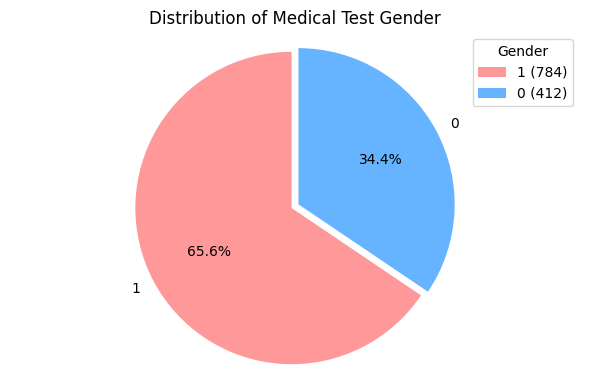

In [9]:
result_counts = df['Gender'].value_counts()
plt.figure(figsize=(6, 4))
plt.pie(result_counts, labels=result_counts.index, autopct='%1.1f%%', startangle=90, colors=['#ff9999','#66b3ff'],explode=(0.05, 0))  
plt.title('Distribution of Medical Test Gender', fontsize=12)
plt.axis('equal')
plt.legend(title="Gender", loc="upper right",  labels=[f"{label} ({count})" for label, count in zip(result_counts.index, result_counts)])

plt.tight_layout()
plt.show()

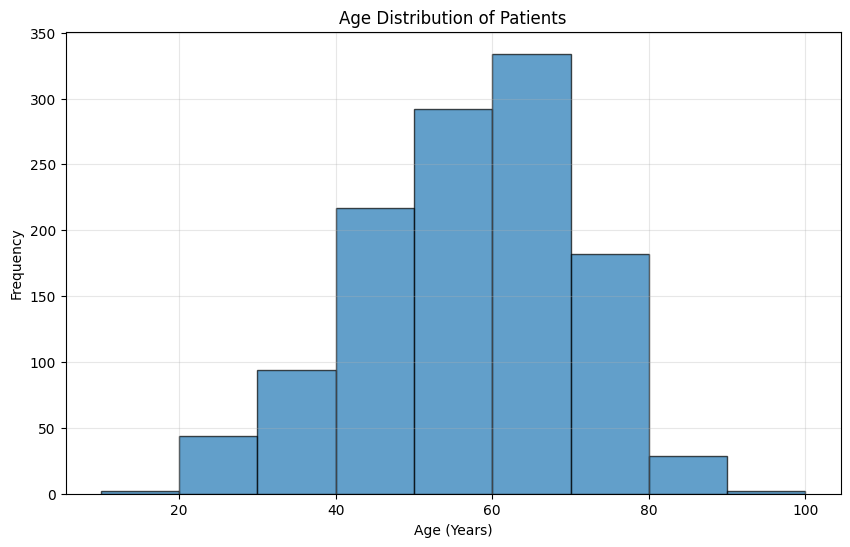

In [10]:
ages = df['Age']
plt.figure(figsize=(10, 6))  
plt.hist(ages, bins=range(10, 101, 10), edgecolor='black', alpha=0.7)  
plt.xlabel('Age (Years)')
plt.ylabel('Frequency')
plt.title('Age Distribution of Patients')

plt.grid(True, alpha=0.3)

plt.show()

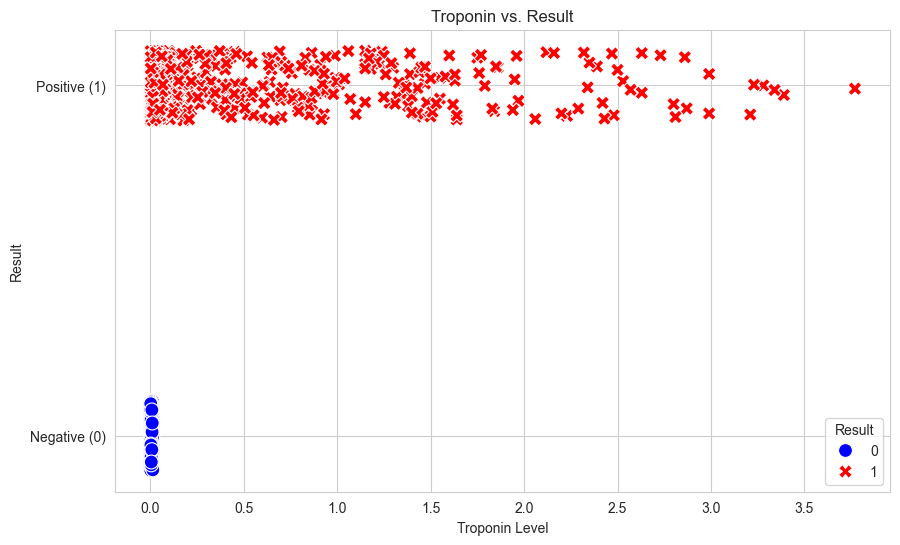

In [11]:
troponin = df['Troponin']
result = df['Result']

jitter = 0.1
result_jittered = result + np.random.uniform(-jitter, jitter, size=result.shape)

sns.set_style("whitegrid")
plt.figure(figsize=(10, 6))
sns.scatterplot(x=troponin, y=result_jittered, hue=result, style=result, palette={0: 'blue', 1: 'red'}, s=100)

plt.yticks([0, 1], ['Negative (0)', 'Positive (1)'])

plt.xlabel('Troponin Level')
plt.ylabel('Result')
plt.title('Troponin vs. Result')

plt.show()

In [12]:
duplicates = df.duplicated().sum()
print(f"Number of duplicate rows: {duplicates}")

Number of duplicate rows: 0


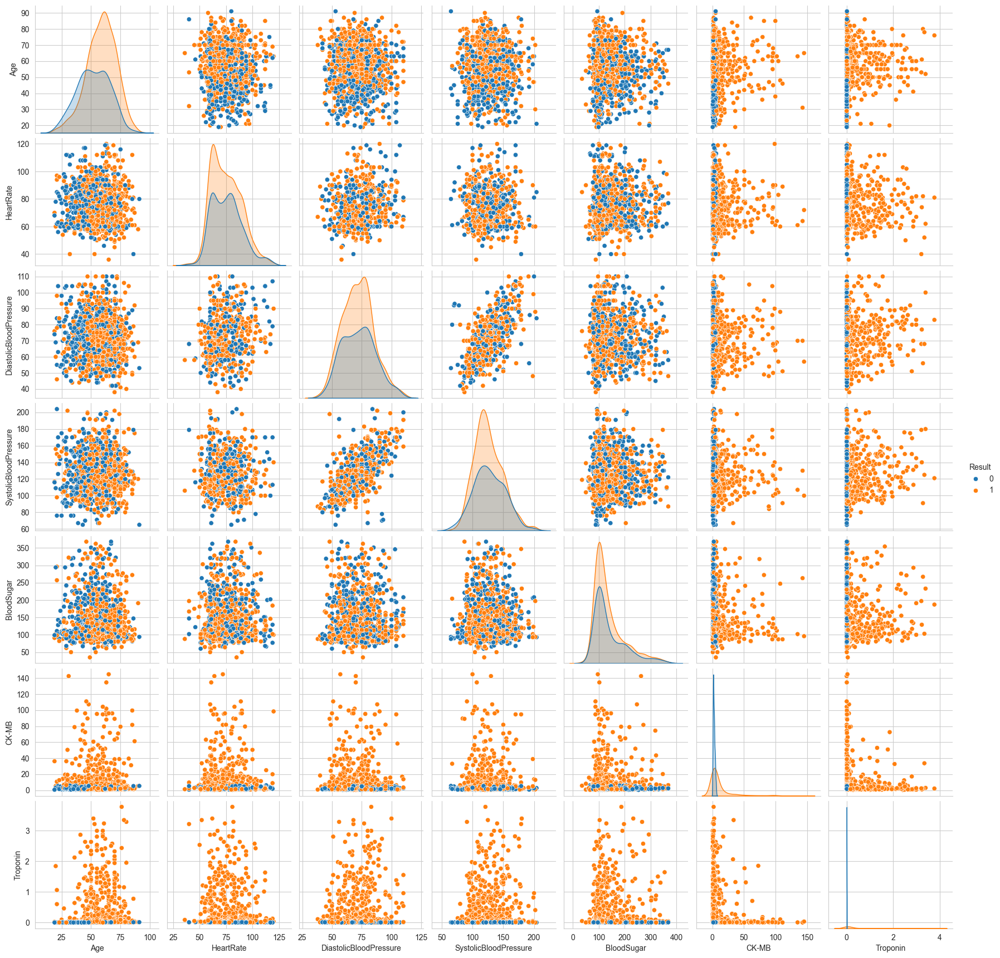

In [13]:
sns.pairplot(df, hue='Result', vars=['Age', 'HeartRate','DiastolicBloodPressure', 'SystolicBloodPressure','BloodSugar','CK-MB', 'Troponin'])
plt.show()

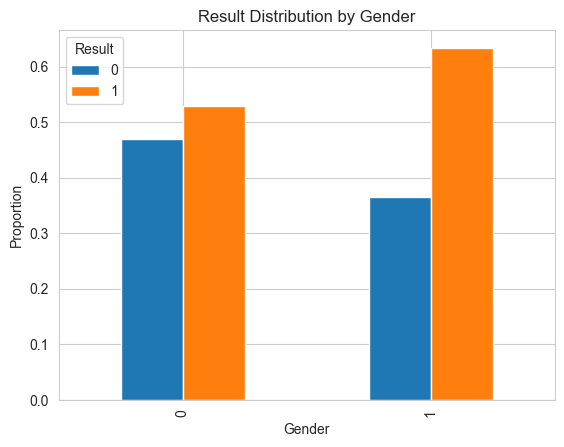

In [14]:
pd.crosstab(df['Gender'], df['Result'], normalize='index').plot(kind='bar')
plt.title('Result Distribution by Gender')
plt.ylabel('Proportion')
plt.show()

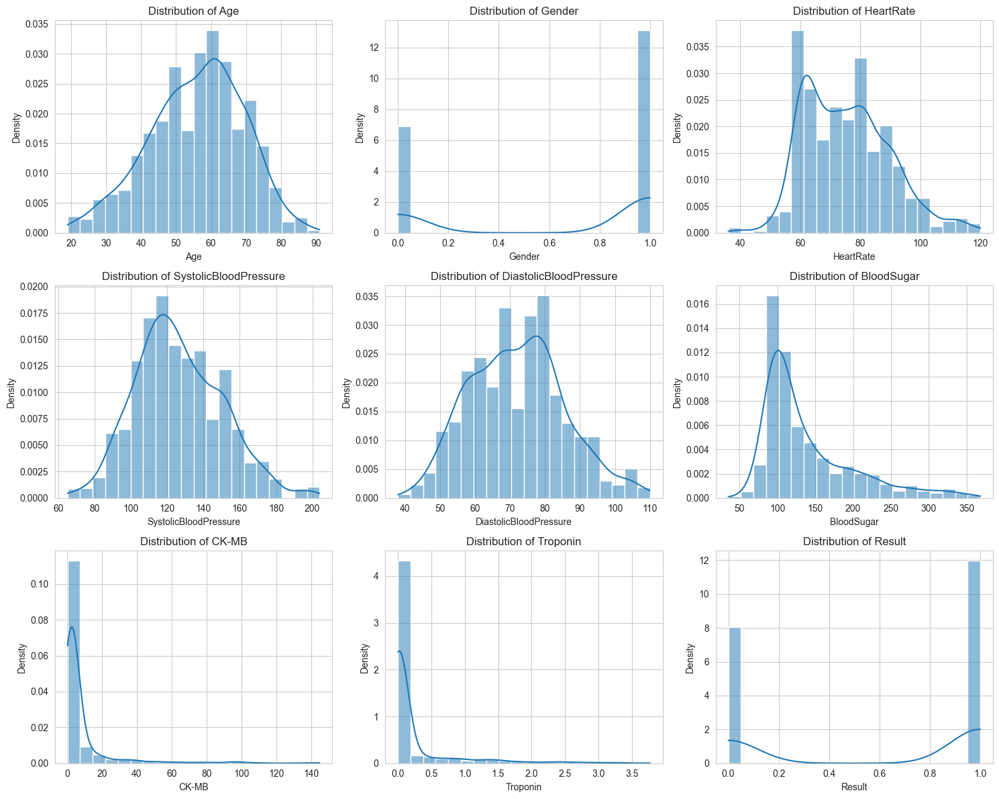

In [15]:
plt.figure(figsize=(15, 12))

# Loop through each column in the DataFrame to plot histograms with KDE
for i, column in enumerate(df.columns, 1):
    plt.subplot((len(df.columns) + 2) // 3, 3, i)  # Adjust subplot grid dynamically
    sns.histplot(data=df, x=column, bins=20, kde=True, stat="density")  # Histogram with KDE
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Density')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()

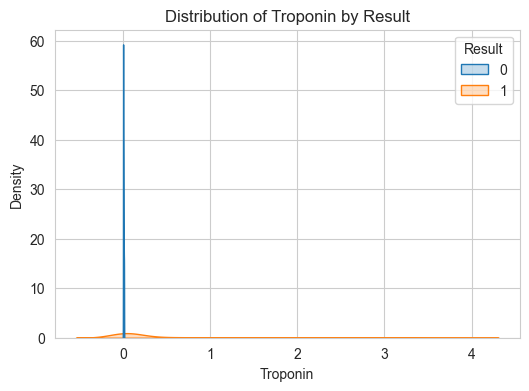

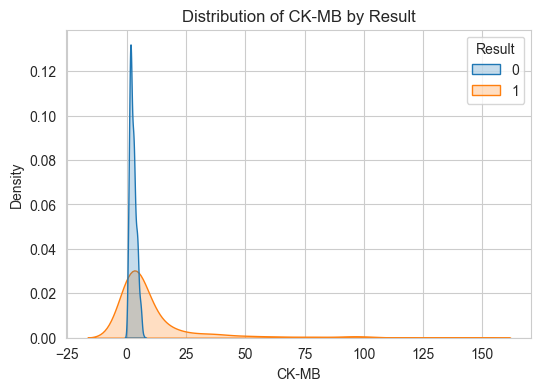

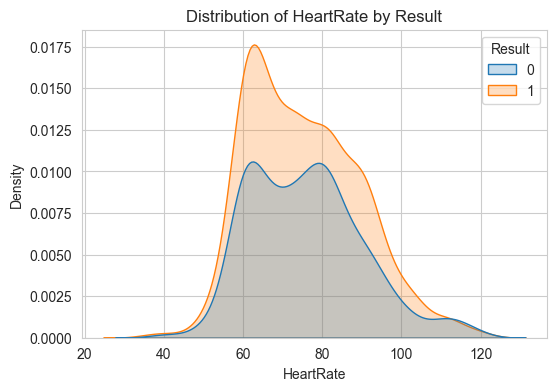

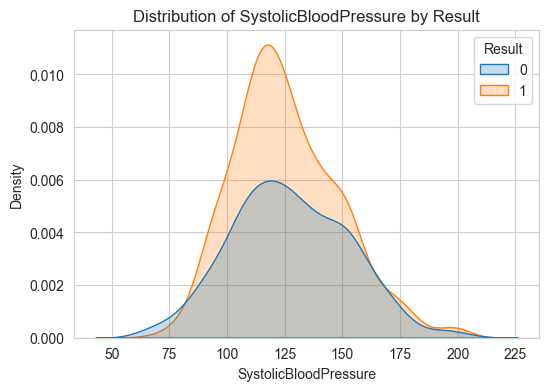

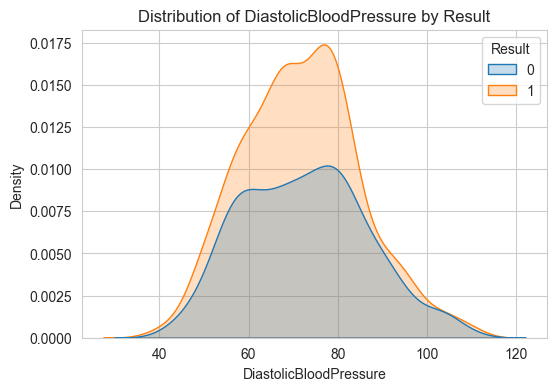

In [16]:
key_biomarkers = ['Troponin', 'CK-MB', 'HeartRate', 'SystolicBloodPressure', 'DiastolicBloodPressure']
for biomarker in key_biomarkers:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(data=df, x=biomarker, hue='Result', fill=True)
    plt.title(f'Distribution of {biomarker} by Result')
    plt.show()

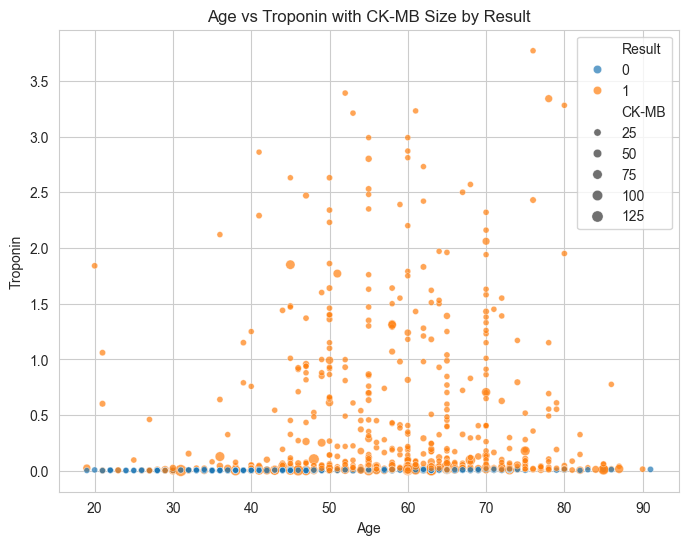

In [17]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, x='Age', y='Troponin', hue='Result', size='CK-MB', alpha=0.7)
plt.title('Age vs Troponin with CK-MB Size by Result')
plt.show()

In [18]:
import plotly.express as px
fig = px.scatter_matrix(df, dimensions=['Age', 'HeartRate', 'SystolicBloodPressure', 'Troponin'], color='Result', opacity=0.7)
fig.update_layout(width=1000, height=1000 )
fig.show()

In [19]:
from sklearn.preprocessing import LabelEncoder
encoder=LabelEncoder()
df['Result']=encoder.fit_transform(df['Result'])

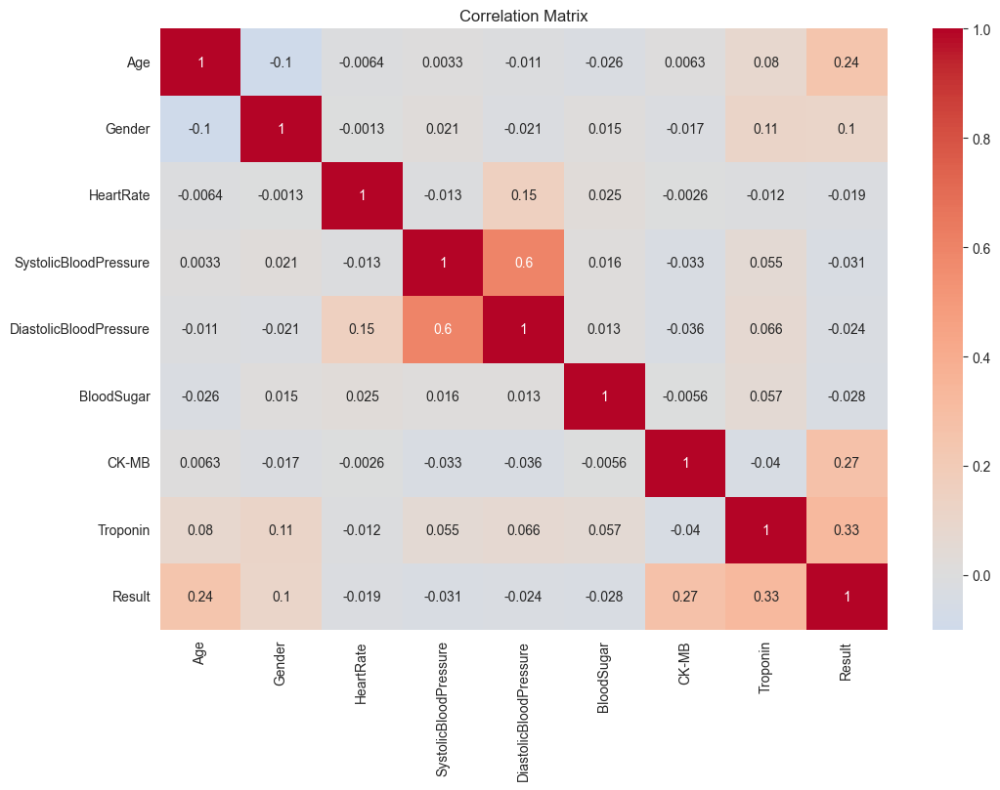

In [20]:
plt.figure(figsize=(12, 8))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix')
plt.show()

In [21]:
corr_matrix = df.corr()
upper_triangle = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
sorted_corr = upper_triangle.unstack().sort_values(ascending=False)

print("Unique Pairwise Correlations (Sorted in Descending Order) with respect to result:")
print(sorted_corr['Result'].dropna()) 

Unique Pairwise Correlations (Sorted in Descending Order) with respect to result:
Troponin                  0.327857
CK-MB                     0.267170
Age                       0.243937
Gender                    0.101567
HeartRate                -0.019384
DiastolicBloodPressure   -0.024375
BloodSugar               -0.028080
SystolicBloodPressure    -0.031073
dtype: float64


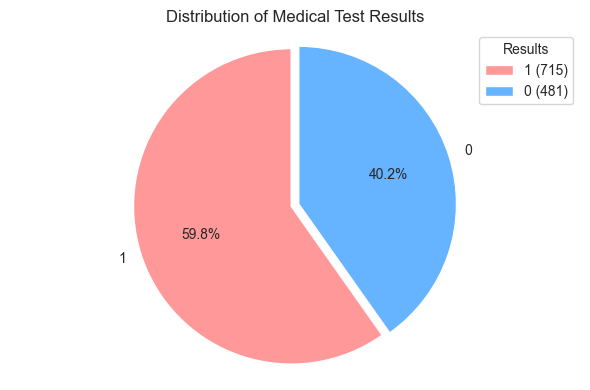

In [22]:
result_counts = df['Result'].value_counts()
plt.figure(figsize=(6, 4))
plt.pie(result_counts, labels=result_counts.index, autopct='%1.1f%%', startangle=90, colors=['#ff9999','#66b3ff'],explode=(0.05, 0))  
plt.title('Distribution of Medical Test Results', fontsize=12)
plt.axis('equal')
plt.legend(title="Results", loc="upper right",  labels=[f"{label} ({count})" for label, count in zip(result_counts.index, result_counts)])

plt.tight_layout()
plt.show()

In [23]:
X = df.drop('Result', axis=1).values.astype(np.float32)
y = df['Result'].values.astype(np.int32)

In [24]:
from imblearn.over_sampling import SMOTE

In [25]:
smote = SMOTE(random_state=42, sampling_strategy='auto') 

In [26]:
X, y = smote.fit_resample(X, y)

In [27]:
pd.Series(y).value_counts()

0    715
1    715
Name: count, dtype: int64

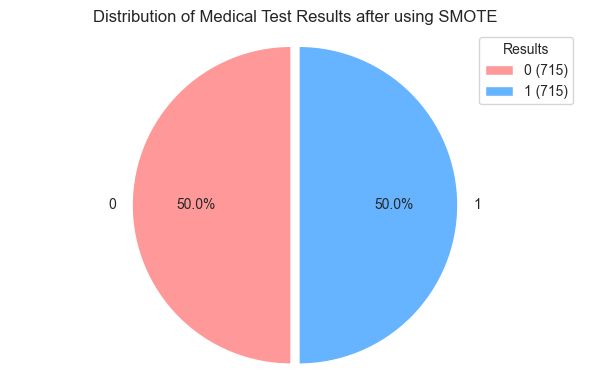

In [28]:
result_counts = pd.Series(y).value_counts()
plt.figure(figsize=(6, 4))
plt.pie(result_counts, labels=result_counts.index, autopct='%1.1f%%', startangle=90, colors=['#ff9999','#66b3ff'],explode=(0.05, 0))  
plt.title('Distribution of Medical Test Results after using SMOTE', fontsize=12)
plt.axis('equal')
plt.legend(title="Results", loc="upper right",  labels=[f"{label} ({count})" for label, count in zip(result_counts.index, result_counts)])

plt.tight_layout()
plt.show()

In [29]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 42)

In [30]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [31]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, roc_auc_score, confusion_matrix, classification_report, f1_score   
from sklearn.model_selection import learning_curve
from sklearn.model_selection import GridSearchCV

SVC
Accuracy: 0.8007
Precision: 0.9135
Recall: 0.6643
F1-Score (fs): 0.7692
              precision    recall  f1-score   support

           0       0.74      0.94      0.82       143
           1       0.91      0.66      0.77       143

    accuracy                           0.80       286
   macro avg       0.82      0.80      0.80       286
weighted avg       0.82      0.80      0.80       286



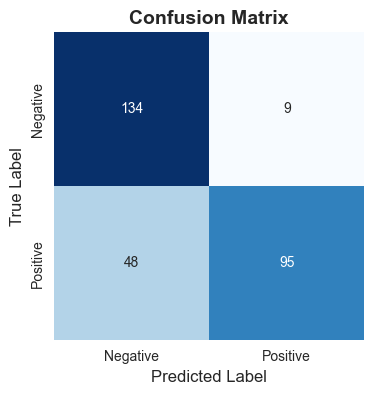

In [32]:
svm=SVC(probability=True)

print("="*60)
print(svm.__class__.__name__)
print("="*60)
    
svm.fit(X_train, y_train)
y_pred = svm.predict(X_test)
    
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
fs = f1_score(y_test, y_pred) 


print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score (fs): {fs:.4f}")
print(classification_report(y_test, y_pred))
    
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.title('Confusion Matrix', fontsize=14, weight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.show()
    

LogisticRegression
Accuracy: 0.8427
Precision: 0.9623
Recall: 0.7133
F1-Score (fs): 0.8193
              precision    recall  f1-score   support

           0       0.77      0.97      0.86       143
           1       0.96      0.71      0.82       143

    accuracy                           0.84       286
   macro avg       0.87      0.84      0.84       286
weighted avg       0.87      0.84      0.84       286



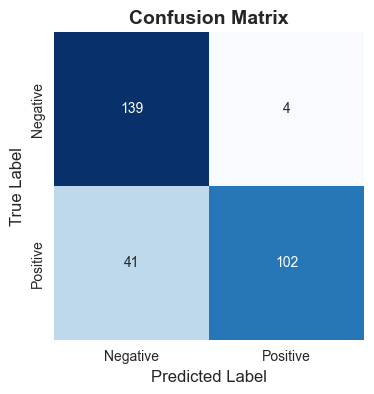

In [33]:
lr=LogisticRegression(max_iter=500)

print("="*60)
print(lr.__class__.__name__)
print("="*60)
    
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)
    
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
fs = f1_score(y_test, y_pred)   

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score (fs): {fs:.4f}")
print(classification_report(y_test, y_pred))
    
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.title('Confusion Matrix', fontsize=14, weight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.show()
    

RandomForestClassifier
Accuracy: 0.9965
Precision: 0.9931
Recall: 1.0000
F1-Score (fs): 0.9965
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       143
           1       0.99      1.00      1.00       143

    accuracy                           1.00       286
   macro avg       1.00      1.00      1.00       286
weighted avg       1.00      1.00      1.00       286



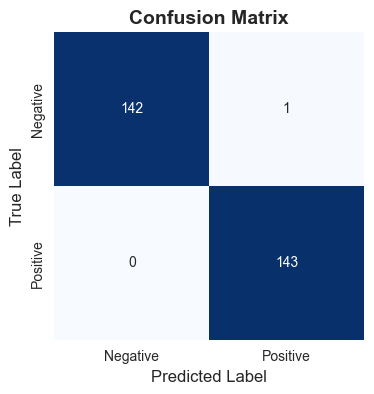

In [34]:
rf=RandomForestClassifier()  

print("="*60)
print(rf.__class__.__name__)
print("="*60)
    
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
    
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
fs = f1_score(y_test, y_pred) 

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score (fs): {fs:.4f}")
print(classification_report(y_test, y_pred))
    
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.title('Confusion Matrix', fontsize=14, weight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.show()
    

DecisionTreeClassifier
Accuracy: 0.9965
Precision: 0.9931
Recall: 1.0000
F1-Score (fs): 0.9965
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       143
           1       0.99      1.00      1.00       143

    accuracy                           1.00       286
   macro avg       1.00      1.00      1.00       286
weighted avg       1.00      1.00      1.00       286



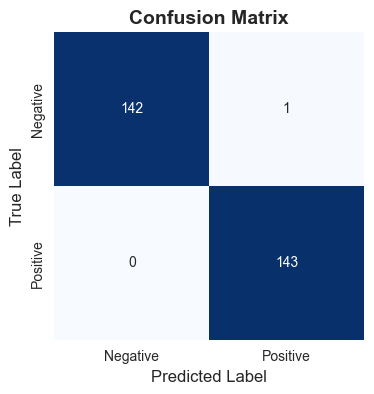

In [35]:
dt=DecisionTreeClassifier()

print("="*60)
print(dt.__class__.__name__)
print("="*60)
    
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
    
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
fs = f1_score(y_test, y_pred) 

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score (fs): {fs:.4f}")
print(classification_report(y_test, y_pred))
    
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.title('Confusion Matrix', fontsize=14, weight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.show()
    

XGBClassifier
Accuracy: 0.9965
Precision: 0.9931
Recall: 1.0000
F1-Score (fs): 0.9965
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       143
           1       0.99      1.00      1.00       143

    accuracy                           1.00       286
   macro avg       1.00      1.00      1.00       286
weighted avg       1.00      1.00      1.00       286



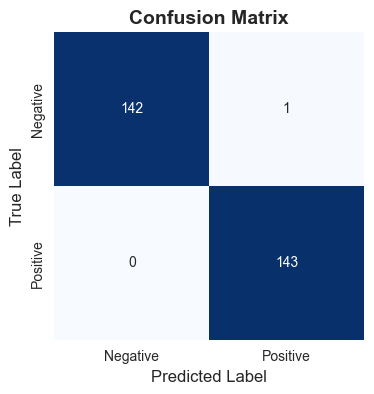

In [36]:
xgb=XGBClassifier()  

print("="*60)
print(xgb.__class__.__name__)
print("="*60)
    
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)
    
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
fs = f1_score(y_test, y_pred)    

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score (fs): {fs:.4f}")
print(classification_report(y_test, y_pred))
    
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.title('Confusion Matrix', fontsize=14, weight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.show()
    

Fitting 3 folds for each of 40 candidates, totalling 120 fits
Best Parameters: {'C': 100, 'gamma': 'scale', 'kernel': 'linear'}
Best Cross-Validation Accuracy: 0.9440642563658601

Best Model Performance on Test Set:
Accuracy: 0.9545
Precision: 0.9779
Recall: 0.9301
F1-Score (fs): 0.9534


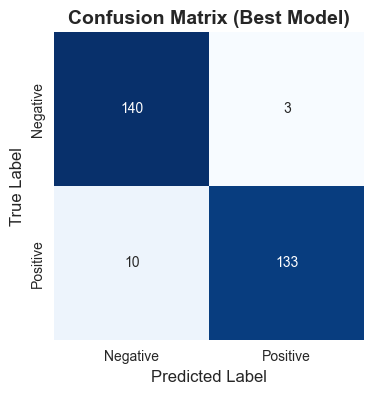

In [37]:
svc = SVC(degree=3, decision_function_shape='ovr', max_iter=-1, tol=0.001, probability=True)
param_grid = {
    'C': [0.1, 1, 10, 100],
    'gamma': ['scale','auto', 0.1, 1, 10],
    'kernel': ['linear', 'rbf']
}

grid_search = GridSearchCV(
    estimator=svc,
    param_grid=param_grid,
    cv=3,              
    scoring='accuracy',
    n_jobs=-1,
    verbose=1
)

grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Accuracy:", grid_search.best_score_)

best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test) 

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
fs = f1_score(y_test, y_pred)  

print("\nBest Model Performance on Test Set:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score (fs): {fs:.4f}")

conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.title('Confusion Matrix (Best Model)', fontsize=14, weight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.show()


Best Parameters: {'C': 10000.0, 'class_weight': None, 'penalty': 'l2', 'solver': 'liblinear'}
Best Cross-Validation Score: 0.9536658239485176

Best Model Performance on Test Set:
Accuracy: 0.9615
Precision: 0.9714
Recall: 0.9510
F1-Score (fs): 0.9611


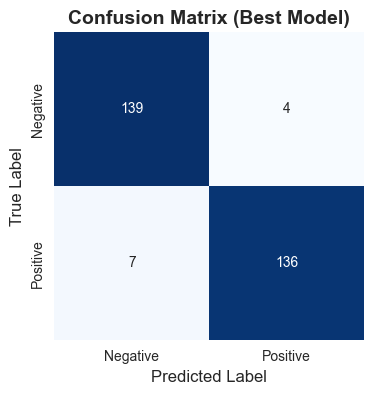

In [38]:
lr = LogisticRegression(max_iter=500,intercept_scaling=1, tol=0.0001)

param_grid = [
    {
        'solver': ['liblinear'],
        'penalty': ['l1', 'l2'],
        'C': np.logspace(-4, 4, 20),
        'class_weight': [None, 'balanced']
    },
    
    {
        'solver': ['newton-cg', 'lbfgs', 'sag'],
        'penalty': ['l2'],
        'C': np.logspace(-4, 4, 20),
        'class_weight': [None, 'balanced']
    },
    
    {
        'solver': ['saga'],
        'penalty': ['l1', 'l2', 'elasticnet'],
        'C': np.logspace(-4, 4, 20),
        'l1_ratio': [0.1, 0.5, 0.9],
        'class_weight': [None, 'balanced']
    }
]

grid_search = GridSearchCV(
    estimator=lr,
    param_grid=param_grid,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    error_score='raise' 
)

grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Score:", grid_search.best_score_)

best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)  

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
fs = f1_score(y_test, y_pred) 

print("\nBest Model Performance on Test Set:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score (fs): {fs:.4f}")

conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.title('Confusion Matrix (Best Model)', fontsize=14, weight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.show()


Fitting 5 folds for each of 1152 candidates, totalling 5760 fits
Best Parameters: {'criterion': 'gini', 'max_depth': None, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 50}
Best Cross-Validation Accuracy: 0.990385352026354

Best Model Performance on Test Set:
Accuracy: 0.9965
Precision: 0.9931
Recall: 1.0000
F1-Score (fs): 0.9965


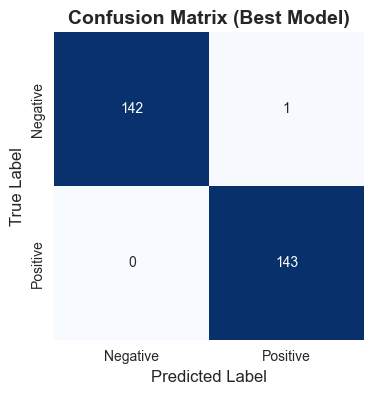

In [39]:
rf = RandomForestClassifier(random_state=42)

param_grid = {
    'n_estimators': [50, 100, 200],         
    'max_depth': [None, 5, 11, 17, 23, 29],        
    'min_samples_split': [2, 5, 10, 15],        
    'min_samples_leaf': [1, 2, 5, 10],          
    'max_features': ['sqrt', 'log2'] ,
    'criterion':['gini', 'entropy']
}

grid_search = GridSearchCV(
    estimator=rf,
    param_grid=param_grid,
    cv=5,                   
    scoring='accuracy',     
    n_jobs=-1,              
    verbose=1               
)

grid_search.fit(X_train, y_train)

print("Best Parameters:", grid_search.best_params_)
print("Best Cross-Validation Accuracy:", grid_search.best_score_)

best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
fs = f1_score(y_test, y_pred)

print("\nBest Model Performance on Test Set:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score (fs): {fs:.4f}")

conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.title('Confusion Matrix (Best Model)', fontsize=14, weight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.show()

Fitting 5 folds for each of 576 candidates, totalling 2880 fits

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 5, 'max_features': None, 'min_samples_leaf': 2, 'min_samples_split': 10}
Best Cross-Validation Accuracy: 0.9939

Best Model Performance on Test Set:
Accuracy: 0.9965
Precision: 0.9931
Recall: 1.0000
F1-Score (fs): 0.9965


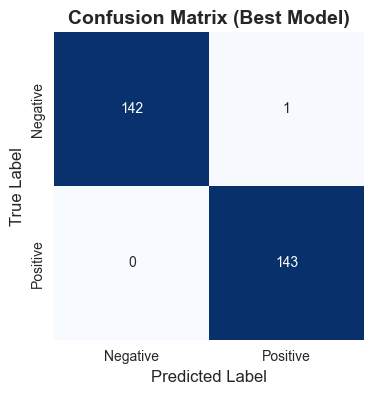

In [40]:
dt = DecisionTreeClassifier(random_state=42)

param_grid = {
    'max_depth': [5, 11, 17, 23, 29, None],              
    'min_samples_split': [2, 5, 10, 15],           
    'min_samples_leaf': [1,2, 5, 10],                
    'criterion': ['gini', 'entropy'],              
    'max_features': [None, 'sqrt', 'log2']         
}

grid_search = GridSearchCV(
    estimator=dt,
    param_grid=param_grid,
    cv=5,                   
    scoring='accuracy',     
    n_jobs=-1,              
    verbose=1              
)

grid_search.fit(X_train, y_train)

print("\nBest Hyperparameters:", grid_search.best_params_)
print("Best Cross-Validation Accuracy:", grid_search.best_score_.round(4))

best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
fs = f1_score(y_test, y_pred) 

print("\nBest Model Performance on Test Set:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score (fs): {fs:.4f}")

conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.title('Confusion Matrix (Best Model)', fontsize=14, weight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.show()

Fitting 5 folds for each of 405 candidates, totalling 2025 fits

Best Hyperparameters: {'learning_rate': 0.01, 'max_depth': 2, 'min_child_weight': 3, 'n_estimators': 50, 'subsample': 0.6}
Best Cross-Validation Accuracy: 0.9886

Best Model Performance on Test Set:
Accuracy: 0.9965
Precision: 0.9931
Recall: 1.0000
F1-Score (fs): 0.9965


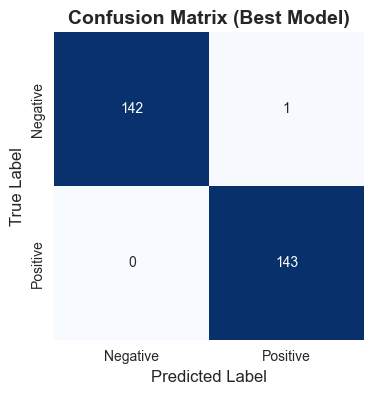

In [41]:
xgb = XGBClassifier(random_state=42, eval_metric='logloss')

param_grid = {
    'max_depth': [2, 10, 1],              
    'learning_rate': [0.01, 0.1, 0.05],  
    'n_estimators': [50, 100, 200],    
    'subsample': [0.6, 0.7, 0.8],       
    'min_child_weight':[3,4,5,6,7] 
}

grid_search = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid,
    cv=5,                  
    scoring='accuracy',    
    n_jobs=-1,            
    verbose=1             
)

grid_search.fit(X_train, y_train)

print("\nBest Hyperparameters:", grid_search.best_params_)
print("Best Cross-Validation Accuracy:", grid_search.best_score_.round(4))

best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
fs = f1_score(y_test, y_pred) 

print("\nBest Model Performance on Test Set:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1-Score (fs): {fs:.4f}")


conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(4, 4))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.title('Confusion Matrix (Best Model)', fontsize=14, weight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.show()
